# Eksperiment 1: patch-level binarna klasifikacija defekta

Ovaj notebook dokumentuje formiranje skupa, izbor modela i konačnu evaluaciju binarnog klasifikatora **defect / no_defect**.

Jedinica analize je kvadratni patch isečen iz originalne slike. Klasa `defect` označava patch formiran oko anotiranog defekta. Klasa `no_defect` označava patch iz iste slike koji ne preseca nijedan poznati anotirani region. Zbog toga rezultat ne predstavlja whole-image klasifikaciju i ne dokazuje da su svi negativni patch-evi potpuno zdrave površine.

Test skup je korišćen jednom, nakon izbora kombinacije feature extractora, klasifikatora i hiperparametara na validation skupu.

In [2]:
from pathlib import Path
import json

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import display
from PIL import Image
from sklearn.metrics import (
    average_precision_score,
    precision_recall_curve,
    roc_curve,
)

PROJECT_ROOT = Path.cwd()

METADATA_PATH = Path("data/patch_metadata.csv")
RESULT_DIRECTORY = Path("data/results/experiment_1_binary")
VALIDATION_SUMMARY_PATH = RESULT_DIRECTORY / "validation_model_comparison.csv"
FINAL_RESULT_PATH = RESULT_DIRECTORY / "final_test_results.json"
PREDICTIONS_PATH = RESULT_DIRECTORY / "test_predictions.csv"
REPORT_PATH = RESULT_DIRECTORY / "test_classification_report.csv"
CONFUSION_COUNTS_PATH = RESULT_DIRECTORY / "test_confusion_matrix_counts.csv"
CONFUSION_NORMALIZED_PATH = RESULT_DIRECTORY / "test_confusion_matrix_normalized.csv"
PAIR_AUDIT_PATH = RESULT_DIRECTORY / "patch_pair_audit_train.jpg"

plt.style.use("seaborn-v0_8-whitegrid")
plt.rcParams.update({
    "figure.figsize": (10, 5),
    "axes.titlesize": 13,
    "axes.labelsize": 11,
    "font.size": 10,
})

EXTRACTOR_COLORS = {
    "ResNet50": "#2563eb",
    "Inception-ResNet-v2": "#7c3aed",
    "ConvNeXt V2 Tiny": "#0891b2",
}

CLASS_COLORS = {
    "defect": "#dc2626",
    "no_defect": "#16a34a",
}

required_paths = [
    METADATA_PATH,
    VALIDATION_SUMMARY_PATH,
    FINAL_RESULT_PATH,
    PREDICTIONS_PATH,
    REPORT_PATH,
    CONFUSION_COUNTS_PATH,
    CONFUSION_NORMALIZED_PATH,
]

for required_path in required_paths:
    if not required_path.is_file():
        raise FileNotFoundError(f"Nedostaje fajl: {required_path}")

print("Svi potrebni artefakti su pronađeni.")

FileNotFoundError: Nedostaje fajl: data/patch_metadata.csv

## 1. Skup podataka i podela

Pozitivni i negativni patch čine par i imaju iste dimenzije. Svi patch-evi iste originalne slike pripadaju istom splitu. Vizuelno slične originalne slike grupisane su perceptualnim hashom sa pragom 6, pa cela vizuelna grupa ostaje u jednom splitu.

In [ ]:
metadata = pd.read_csv(METADATA_PATH)

split_order = ["train", "validation", "test"]
class_order = ["defect", "no_defect"]

dataset_summary = pd.DataFrame(
    {
        "Vrednost": [
            len(metadata),
            metadata["pair_id"].nunique(),
            metadata["image_id"].nunique(),
            metadata["visual_group"].nunique(),
            metadata["patch_width"].min(),
            metadata["patch_width"].median(),
            metadata["patch_width"].max(),
        ]
    },
    index=[
        "Patch-evi",
        "Patch parovi",
        "Originalne slike",
        "Vizuelne grupe",
        "Najmanja stranica patch-a",
        "Medijana stranice patch-a",
        "Najveća stranica patch-a",
    ],
)

split_class_table = pd.crosstab(
    metadata["split"],
    metadata["target_class"],
).reindex(index=split_order, columns=class_order, fill_value=0)

display(dataset_summary)
display(split_class_table)

,Vrednost
Patch-evi,38206.0
Patch parovi,19103.0
Originalne slike,11631.0
Vizuelne grupe,1756.0
Najmanja stranica patch-a,96.0
Medijana stranice patch-a,300.0
Najveća stranica patch-a,384.0


target_class,defect,no_defect
split,,
train,15283,15283
validation,1910,1910
test,1910,1910


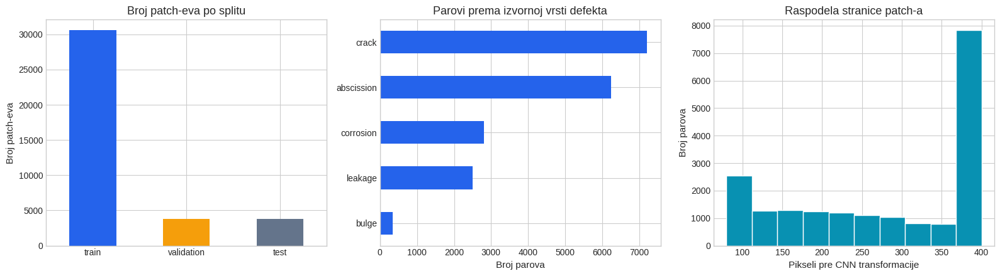

In [ ]:
pair_metadata = metadata.drop_duplicates("pair_id")

figure, axes = plt.subplots(1, 3, figsize=(16, 4.5))

metadata["split"].value_counts().reindex(split_order).plot.bar(
    ax=axes[0],
    color=["#2563eb", "#f59e0b", "#64748b"],
)
axes[0].set_title("Broj patch-eva po splitu")
axes[0].set_xlabel("")
axes[0].set_ylabel("Broj patch-eva")
axes[0].tick_params(axis="x", rotation=0)

pair_metadata["source_defect_class"].value_counts().sort_values().plot.barh(
    ax=axes[1],
    color="#2563eb",
)
axes[1].set_title("Parovi prema izvornoj vrsti defekta")
axes[1].set_xlabel("Broj parova")
axes[1].set_ylabel("")

pair_metadata["patch_width"].plot.hist(
    ax=axes[2],
    bins=np.arange(80, 417, 32),
    color="#0891b2",
    edgecolor="white",
)
axes[2].set_title("Raspodela stranice patch-a")
axes[2].set_xlabel("Pikseli pre CNN transformacije")
axes[2].set_ylabel("Broj parova")

figure.tight_layout()
plt.show()

Skup sadrži 19.103 uparena pozitivna i negativna uzorka, ukupno 38.206 patch-eva. Podela je približno 80/10/10 i potpuno je izbalansirana po ciljnoj klasi u svakom splitu. Izvorne vrste defekata nisu ravnomerno zastupljene: najviše je primera pukotina i abscisije, dok je `bulge` znatno ređi.

## 2. Kontrola curenja i konstrukcija parova

Kontrole ispod proveravaju četiri ključna uslova: vizuelna grupa i originalna slika ne smeju prelaziti između splitova, svaki par mora ostati u jednom splitu i svaki par mora sadržati obe binarne klase.

In [ ]:
leakage_audit = pd.DataFrame(
    {
        "Maksimalan broj splitova": [
            metadata.groupby("visual_group")["split"].nunique().max(),
            metadata.groupby("image_id")["split"].nunique().max(),
            metadata.groupby("pair_id")["split"].nunique().max(),
        ]
    },
    index=["visual_group", "image_id", "pair_id"],
)

pair_label_audit = metadata.groupby("pair_id")["target_class"].nunique()

display(leakage_audit)
print("Parovi sa tačno dve ciljne klase:", int((pair_label_audit == 2).sum()))
print("Neispravni parovi:", int((pair_label_audit != 2).sum()))

assert leakage_audit["Maksimalan broj splitova"].max() == 1
assert (pair_label_audit == 2).all()

print("Kontrola curenja je uspešna.")

,Maksimalan broj splitova
visual_group,1
image_id,1
pair_id,1


Parovi sa tačno dve ciljne klase: 19103
Neispravni parovi: 0
Kontrola curenja je uspešna.


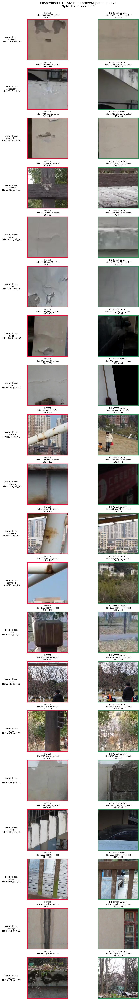

In [ ]:
if PAIR_AUDIT_PATH.is_file():
    audit_image = Image.open(PAIR_AUDIT_PATH)
    display(audit_image)
else:
    print("Vizuelni audit nije pronađen:", PAIR_AUDIT_PATH)

Vizuelni audit je korišćen pre treniranja. Kvadratni patch-evi imaju stranicu između 96 i 384 piksela. Negativni kandidat bira se što bliže pozitivnom patch-u, bez presecanja anotiranih regiona. Time se smanjuje mogućnost da klasifikator uči samo razliku između građevinske površine i nepovezanog sadržaja scene, ali se ta mogućnost ne može potpuno ukloniti.

## 3. Izbor modela na validation skupu

In [ ]:
validation_summary = pd.read_csv(VALIDATION_SUMMARY_PATH).sort_values("rank")

validation_display = validation_summary[
    [
        "rank",
        "feature_extractor",
        "classifier",
        "accuracy",
        "balanced_accuracy",
        "macro_f1",
        "defect_f1",
    ]
].copy()

metric_columns = [
    "accuracy",
    "balanced_accuracy",
    "macro_f1",
    "defect_f1",
]

display(validation_display.style.format({column: "{:.4f}" for column in metric_columns}))

winner = validation_summary.iloc[0]
print(
    f"Izabrani model: {winner['feature_extractor']} + {winner['classifier']}"
)
print(f"Validation Macro F1: {winner['macro_f1']:.4f}")
print("Hiperparametri:", winner["best_parameters"])

,rank,feature_extractor,classifier,accuracy,balanced_accuracy,macro_f1,defect_f1
0,1,ResNet50,XGBoost,0.8838,0.8838,0.8837,0.8854
1,2,ResNet50,Random Forest,0.8615,0.8615,0.8612,0.8674
2,3,ConvNeXt V2 Tiny,XGBoost,0.8547,0.8547,0.8545,0.8487
3,4,ConvNeXt V2 Tiny,Random Forest,0.8385,0.8385,0.8385,0.8372
4,5,Inception-ResNet-v2,XGBoost,0.8385,0.8385,0.8385,0.8402
5,6,Inception-ResNet-v2,Random Forest,0.8304,0.8304,0.8300,0.8377
6,7,ResNet50,Logistic Regression,0.8275,0.8275,0.8272,0.8208
7,8,Inception-ResNet-v2,Logistic Regression,0.8071,0.8071,0.8070,0.8052
8,9,ConvNeXt V2 Tiny,Logistic Regression,0.7958,0.7958,0.7953,0.7848


Izabrani model: ResNet50 + XGBoost
Validation Macro F1: 0.8837
Hiperparametri: {"colsample_bytree": 0.8, "learning_rate": 0.1, "max_depth": 4, "min_child_weight": 5, "n_estimators": 986, "reg_alpha": 0.0, "reg_lambda": 1.0, "subsample": 0.8}


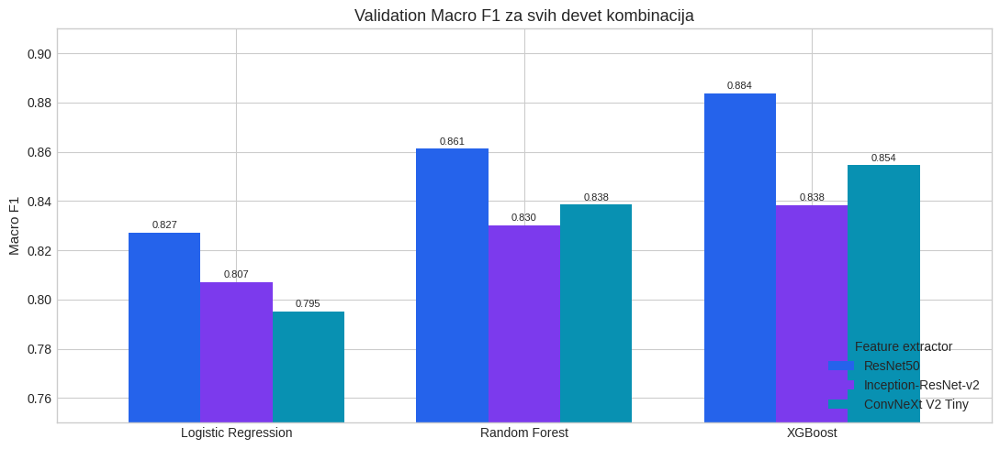

In [ ]:
classifier_order = ["Logistic Regression", "Random Forest", "XGBoost"]
extractor_order = ["ResNet50", "Inception-ResNet-v2", "ConvNeXt V2 Tiny"]

pivot = validation_summary.pivot(
    index="classifier",
    columns="feature_extractor",
    values="macro_f1",
).reindex(index=classifier_order, columns=extractor_order)

axis = pivot.plot.bar(
    figsize=(11, 5),
    color=[EXTRACTOR_COLORS[name] for name in extractor_order],
    width=0.75,
)
axis.set_title("Validation Macro F1 za svih devet kombinacija")
axis.set_xlabel("")
axis.set_ylabel("Macro F1")
axis.set_ylim(0.75, 0.91)
axis.tick_params(axis="x", rotation=0)
axis.legend(title="Feature extractor", loc="lower right")

for container in axis.containers:
    axis.bar_label(container, fmt="%.3f", padding=2, fontsize=8)

plt.tight_layout()
plt.show()

Najbolja validation kombinacija je **ResNet50 + XGBoost**, sa Macro F1 rezultatom 0,8837. ResNet50 je najbolji extractor uz sva tri klasifikatora. XGBoost daje najbolji rezultat za ResNet50 i ConvNeXt V2 Tiny, dok je kod Inception-ResNet-v2 razlika između XGBoost-a i Random Forest-a manja.

## 4. Konačna evaluacija na test skupu

,Metrika,Vrednost
0,Accuracy,0.8128
1,Balanced accuracy,0.8128
2,Macro F1,0.8123
3,Weighted F1,0.8123
4,Defect precision,0.8496
5,Defect recall,0.7602
6,Defect F1,0.8024
7,ROC AUC,0.9072
8,Average precision,0.9023


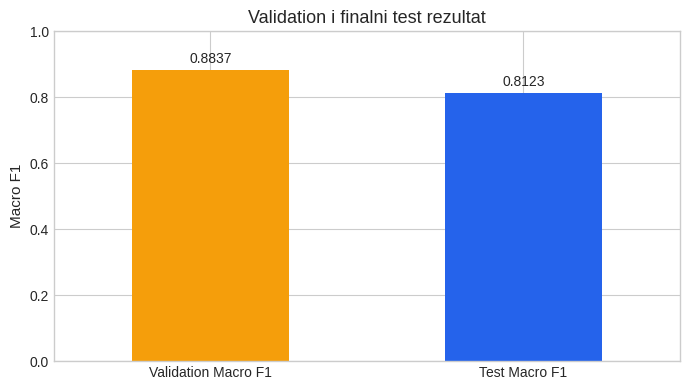

Pad validation → test: 0.0714


In [ ]:
with FINAL_RESULT_PATH.open("r", encoding="utf-8") as result_file:
    final_result = json.load(result_file)

test_metrics = final_result["test_metrics"]

metric_names = {
    "accuracy": "Accuracy",
    "balanced_accuracy": "Balanced accuracy",
    "macro_f1": "Macro F1",
    "weighted_f1": "Weighted F1",
    "defect_precision": "Defect precision",
    "defect_recall": "Defect recall",
    "defect_f1": "Defect F1",
    "roc_auc": "ROC AUC",
    "average_precision": "Average precision",
}

test_metric_table = pd.DataFrame(
    {
        "Metrika": [metric_names[key] for key in metric_names],
        "Vrednost": [test_metrics[key] for key in metric_names],
    }
)

display(test_metric_table.style.format({"Vrednost": "{:.4f}"}))

validation_macro_f1 = final_result["validation_macro_f1"]
test_macro_f1 = test_metrics["macro_f1"]
generalization_gap = validation_macro_f1 - test_macro_f1

comparison = pd.Series(
    {
        "Validation Macro F1": validation_macro_f1,
        "Test Macro F1": test_macro_f1,
    }
)

axis = comparison.plot.bar(
    color=["#f59e0b", "#2563eb"],
    figsize=(7, 4),
)
axis.set_ylim(0, 1)
axis.set_ylabel("Macro F1")
axis.set_title("Validation i finalni test rezultat")
axis.tick_params(axis="x", rotation=0)
axis.bar_label(axis.containers[0], fmt="%.4f", padding=3)
plt.tight_layout()
plt.show()

print(f"Pad validation → test: {generalization_gap:.4f}")

Test Macro F1 iznosi **0,8123**, uz ROC AUC **0,9072** i average precision **0,9023**. Pad od približno 0,0714 u odnosu na validation rezultat pokazuje da je validation skup bio lakši ili sličniji trening skupu. Rezultat testa ostaje jedina nepristrasna procena generalizacije iz sprovedenog protokola.

## 5. Rezultati po klasama

,precision,recall,f1-score,support
no_defect,0.7830,0.8654,0.8222,1910.0000
defect,0.8496,0.7602,0.8024,1910.0000


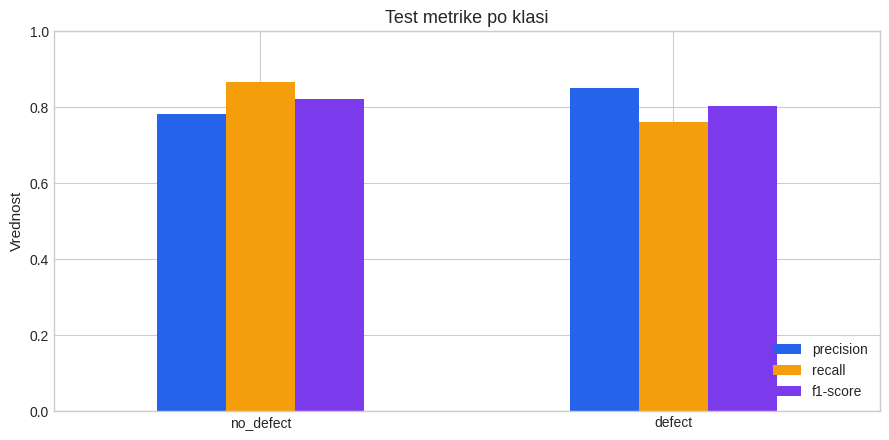

In [ ]:
classification_report_table = pd.read_csv(REPORT_PATH, index_col=0)

class_rows = classification_report_table.loc[["no_defect", "defect"]]
display(class_rows.style.format("{:.4f}"))

axis = class_rows[["precision", "recall", "f1-score"]].plot.bar(
    figsize=(9, 4.5),
    color=["#2563eb", "#f59e0b", "#7c3aed"],
)
axis.set_title("Test metrike po klasi")
axis.set_xlabel("")
axis.set_ylabel("Vrednost")
axis.set_ylim(0, 1)
axis.tick_params(axis="x", rotation=0)
axis.legend(loc="lower right")
plt.tight_layout()
plt.show()

Model bolje zadržava negativne primere: recall klase `no_defect` je 0,8654, dok recall klase `defect` iznosi 0,7602. Precision za `defect` je 0,8496, pa je model konzervativniji pri prijavljivanju defekta: kada prijavi defekt često je u pravu, ali propušta veći deo stvarnih defektnih patch-eva.

## 6. Confusion matrica

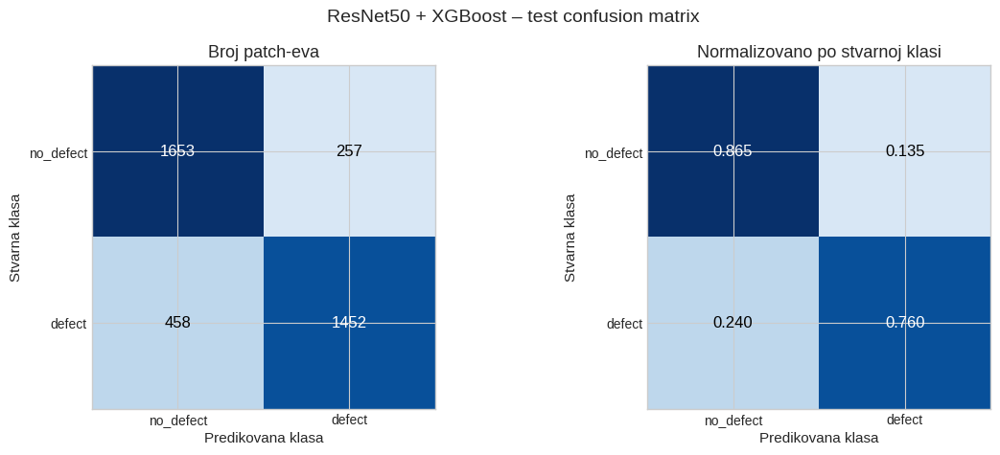

,no_defect,defect
true_class,,
no_defect,1653,257
defect,458,1452


In [ ]:
confusion_counts = pd.read_csv(CONFUSION_COUNTS_PATH, index_col=0)
confusion_normalized = pd.read_csv(CONFUSION_NORMALIZED_PATH, index_col=0)

figure, axes = plt.subplots(1, 2, figsize=(12, 4.8))

for axis, matrix, title, value_format in [
    (axes[0], confusion_counts, "Broj patch-eva", "d"),
    (axes[1], confusion_normalized, "Normalizovano po stvarnoj klasi", ".3f"),
]:
    values = matrix.to_numpy()
    image = axis.imshow(values, cmap="Blues", vmin=0)
    axis.set_xticks(range(len(matrix.columns)), matrix.columns)
    axis.set_yticks(range(len(matrix.index)), matrix.index)
    axis.set_xlabel("Predikovana klasa")
    axis.set_ylabel("Stvarna klasa")
    axis.set_title(title)

    threshold = values.max() / 2
    for row_index in range(values.shape[0]):
        for column_index in range(values.shape[1]):
            value = values[row_index, column_index]
            label = format(int(value), value_format) if value_format == "d" else format(value, value_format)
            axis.text(
                column_index,
                row_index,
                label,
                ha="center",
                va="center",
                color="white" if value > threshold else "black",
                fontsize=12,
            )

figure.suptitle("ResNet50 + XGBoost – test confusion matrix", fontsize=14)
figure.tight_layout()
plt.show()

display(confusion_counts)

Model je pravilno klasifikovao 1.653 negativna i 1.452 pozitivna patch-a. Zabeleženo je 257 lažno pozitivnih i 458 lažno negativnih predikcija. Veći broj lažno negativnih predikcija objašnjava niži recall klase `defect`.

## 7. ROC i precision–recall analiza

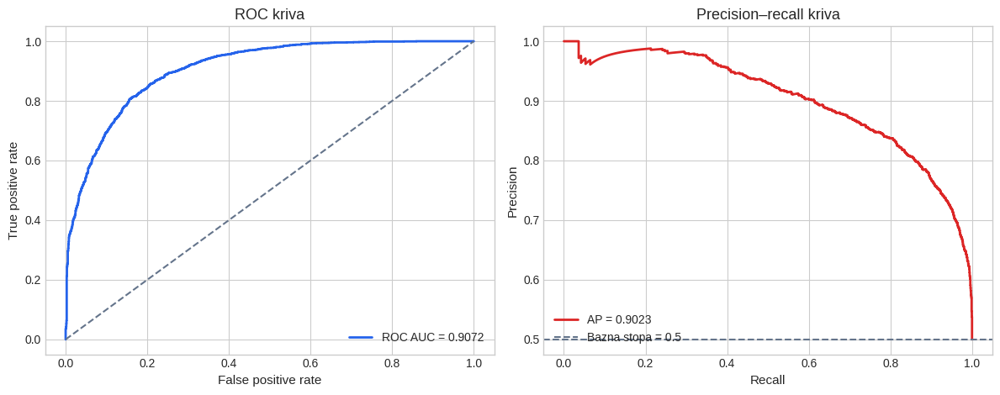

In [ ]:
predictions = pd.read_csv(PREDICTIONS_PATH)
y_true_binary = predictions["true_class"].eq("defect").astype(int)
y_score = predictions["probability_defect"]

false_positive_rate, true_positive_rate, _ = roc_curve(y_true_binary, y_score)
precision_curve, recall_curve, _ = precision_recall_curve(y_true_binary, y_score)
average_precision = average_precision_score(y_true_binary, y_score)

figure, axes = plt.subplots(1, 2, figsize=(12, 4.8))

axes[0].plot(
    false_positive_rate,
    true_positive_rate,
    color="#2563eb",
    linewidth=2,
    label=f"ROC AUC = {test_metrics['roc_auc']:.4f}",
)
axes[0].plot([0, 1], [0, 1], "--", color="#64748b")
axes[0].set_xlabel("False positive rate")
axes[0].set_ylabel("True positive rate")
axes[0].set_title("ROC kriva")
axes[0].legend(loc="lower right")

axes[1].plot(
    recall_curve,
    precision_curve,
    color="#dc2626",
    linewidth=2,
    label=f"AP = {average_precision:.4f}",
)
axes[1].axhline(0.5, linestyle="--", color="#64748b", label="Bazna stopa = 0.5")
axes[1].set_xlabel("Recall")
axes[1].set_ylabel("Precision")
axes[1].set_title("Precision–recall kriva")
axes[1].legend(loc="lower left")

figure.tight_layout()
plt.show()

Obe krive pokazuju da verovatnoće modela dobro rangiraju pozitivne i negativne primere. Klasifikacija u konačnom izveštaju koristi standardni prag 0,5. Prag nije dodatno podešavan na test skupu.

## 8. Detekcija prema izvornoj vrsti defekta

,support,recall,mean_defect_probability
source_defect_class,,,
bulge,27,0.8889,0.8860
leakage,284,0.8063,0.7806
crack,643,0.7838,0.7501
abscission,886,0.7348,0.7072
corrosion,70,0.6286,0.6461


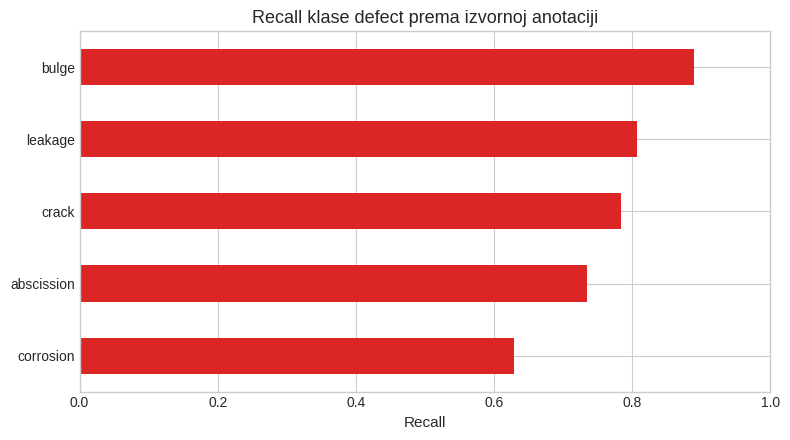

In [ ]:
positive_predictions = predictions.loc[
    predictions["true_class"].eq("defect")
].copy()

positive_predictions["detected"] = positive_predictions["predicted_class"].eq("defect")

source_class_performance = (
    positive_predictions.groupby("source_defect_class")
    .agg(
        support=("patch_id", "size"),
        recall=("detected", "mean"),
        mean_defect_probability=("probability_defect", "mean"),
    )
    .sort_values("recall", ascending=False)
)

display(source_class_performance.style.format({
    "recall": "{:.4f}",
    "mean_defect_probability": "{:.4f}",
}))

axis = source_class_performance.sort_values("recall")["recall"].plot.barh(
    color="#dc2626",
    figsize=(8, 4.5),
)
axis.set_xlim(0, 1)
axis.set_xlabel("Recall")
axis.set_ylabel("")
axis.set_title("Recall klase defect prema izvornoj anotaciji")
plt.tight_layout()
plt.show()

Najviši recall ima `bulge` (0,8889), ali samo na 27 test primera, pa je ta procena nestabilna. `Leakage` i `crack` imaju recall 0,8063 i 0,7838. Najslabije je detektovana `corrosion`, sa recall rezultatom 0,6286 na 70 primera. Ove vrednosti služe za opis ponašanja binarnog modela; izvorna vrsta defekta nije korišćena kao ciljna klasa pri treniranju.

## 9. Analiza grešaka i pouzdanosti

,count,mean,median,max
correct,,,,
Netačno,715,0.7647,0.7767,0.9983
Tačno,3105,0.9059,0.9635,1.0000


,Broj parova
correct,
Nijedan tačan,66
Jedan tačan,583
Oba tačna,1261


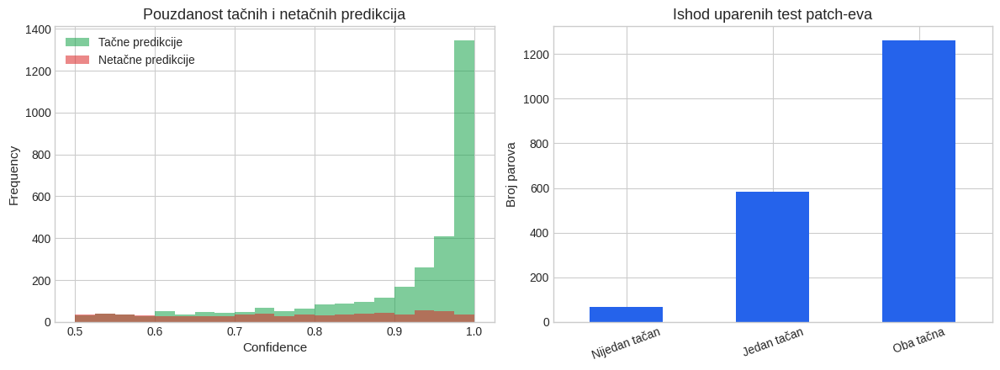

Greške sa confidence ≥ 0.90: 177


In [ ]:
confidence_summary = (
    predictions.groupby("correct")["confidence"]
    .agg(["count", "mean", "median", "max"])
    .rename(index={False: "Netačno", True: "Tačno"})
)

pair_outcomes = (
    predictions.groupby("pair_id")["correct"]
    .sum()
    .value_counts()
    .reindex([0, 1, 2], fill_value=0)
    .rename(index={0: "Nijedan tačan", 1: "Jedan tačan", 2: "Oba tačna"})
    .to_frame("Broj parova")
)

display(confidence_summary.style.format({
    "mean": "{:.4f}",
    "median": "{:.4f}",
    "max": "{:.4f}",
}))
display(pair_outcomes)

figure, axes = plt.subplots(1, 2, figsize=(12, 4.5))

for is_correct, label, color in [
    (True, "Tačne predikcije", "#16a34a"),
    (False, "Netačne predikcije", "#dc2626"),
]:
    predictions.loc[predictions["correct"].eq(is_correct), "confidence"].plot.hist(
        ax=axes[0],
        bins=np.linspace(0.5, 1.0, 21),
        alpha=0.55,
        label=label,
        color=color,
    )

axes[0].set_title("Pouzdanost tačnih i netačnih predikcija")
axes[0].set_xlabel("Confidence")
axes[0].legend()

pair_outcomes.plot.bar(
    ax=axes[1],
    legend=False,
    color="#2563eb",
)
axes[1].set_title("Ishod uparenih test patch-eva")
axes[1].set_xlabel("")
axes[1].set_ylabel("Broj parova")
axes[1].tick_params(axis="x", rotation=20)

figure.tight_layout()
plt.show()

high_confidence_errors = predictions.loc[
    (~predictions["correct"]) & (predictions["confidence"] >= 0.90)
]
print("Greške sa confidence ≥ 0.90:", len(high_confidence_errors))

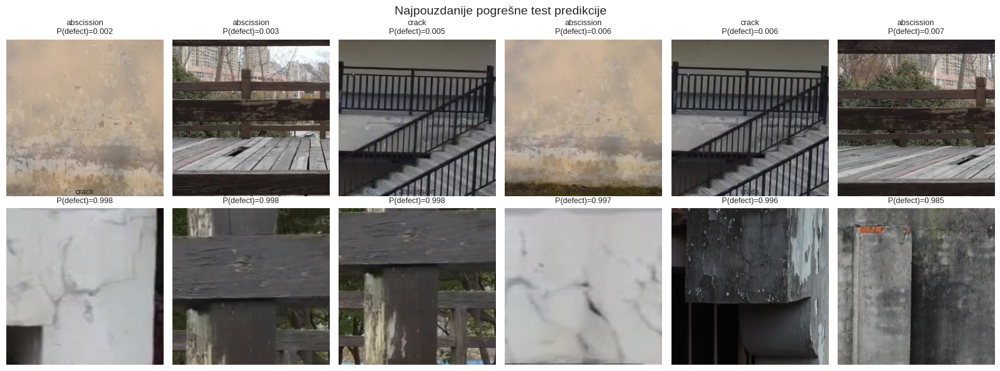

In [ ]:
false_negatives = predictions.loc[
    predictions["true_class"].eq("defect")
    & predictions["predicted_class"].eq("no_defect")
].nlargest(6, "confidence")

false_positives = predictions.loc[
    predictions["true_class"].eq("no_defect")
    & predictions["predicted_class"].eq("defect")
].nlargest(6, "confidence")

selected_errors = [
    ("Lažno negativni", false_negatives),
    ("Lažno pozitivni", false_positives),
]

figure, axes = plt.subplots(2, 6, figsize=(16, 6))

for row_index, (error_name, error_rows) in enumerate(selected_errors):
    for column_index, row in enumerate(error_rows.itertuples(index=False)):
        with Image.open(row.image_path) as image:
            patch = image.convert("RGB").crop(
                (int(row.xmin), int(row.ymin), int(row.xmax), int(row.ymax))
            )

        axis = axes[row_index, column_index]
        axis.imshow(patch)
        axis.axis("off")
        axis.set_title(
            f"{row.source_defect_class}\nP(defect)={row.probability_defect:.3f}",
            fontsize=9,
        )

    axes[row_index, 0].set_ylabel(error_name, fontsize=11)

figure.suptitle("Najpouzdanije pogrešne test predikcije", fontsize=14)
figure.tight_layout()
plt.show()

Tačne predikcije u proseku imaju veću pouzdanost, ali postoji 177 grešaka sa confidence vrednošću najmanje 0,90. Od 1.910 test parova, oba patch-a su pravilno klasifikovana u 1.261 paru, jedan je pravilno klasifikovan u 583 para, a oba su pogrešna u 66 parova. Pouzdane greške ukazuju na label noise, vizuelno dvosmislene defekte i razlike u sadržaju pozitivnih i negativnih patch-eva.

## 10. Zaključak

U sprovedenom patch-level eksperimentu najbolja validation kombinacija bila je **ResNet50 + XGBoost**. Nakon ponovnog treniranja na spojenom train i validation skupu, model je na netaknutom test skupu ostvario:

- accuracy: **0,8128**
- balanced accuracy: **0,8128**
- Macro F1: **0,8123**
- Defect F1: **0,8024**
- ROC AUC: **0,9072**
- average precision: **0,9023**

Rezultati pokazuju da pretrained CNN reprezentacije sadrže korisne informacije za razlikovanje anotiranih defektnih regiona od negativnih kandidata. Model je precizniji nego osetljiviji pri detekciji defekta, pa je glavni prostor za unapređenje smanjenje broja lažno negativnih predikcija i pouzdanije formiranje negativne klase.

Eksperiment se može smatrati završenim kao eksploratorna patch-level studija. Konačno tumačenje u okviru projekta zavisi od potvrde profesora da ovakav način formiranja klase `no_defect` odgovara cilju Eksperimenta 1.

## 11. Sačuvani fajlovi

- `data/patch_metadata.csv` – koordinate i split svih patch-eva
- `data/results/experiment_1_binary/patch_metadata_report.json` – izveštaj o formiranju skupa
- `data/results/experiment_1_binary/validation_model_comparison.csv` – poređenje devet validation kombinacija
- `data/results/experiment_1_binary/final_test_results.json` – konačne test metrike i metodološki podaci
- `data/results/experiment_1_binary/test_predictions.csv` – predikcije i verovatnoće svih test patch-eva
- `data/results/experiment_1_binary/test_misclassifications.csv` – izdvojene pogrešne predikcije
- `data/results/experiment_1_binary/test_classification_report.csv` – precision, recall i F1 po klasi
- `data/results/experiment_1_binary/test_confusion_matrix.png` – finalna confusion matrica
- `data/results/experiment_1_binary/final_resnet50_xgboost.json` – sačuvani XGBoost model